## Compare `networkx.spring_layout` with `FaR` in 2D Hyperbolic space

In [4]:
import importlib
import sys
from pathlib import Path

mainPath = Path.cwd().resolve().parent
if str(mainPath) not in sys.path:
	sys.path.insert(0, str(mainPath))

import gd_experiments as gdExperiments
importlib.reload(gdExperiments)

from gd_experiments import (
	metricKeys,
	appendLogRow,
	bestOfN,
	binaryPath,
	compileGd,
	compareResults,
	displayTwo,
	logRowAsPairs,
	plotMetricComparison,
	plotRunScores,
	resultAsPairs,
	runGd,
	runRender,
	setImageScore,
	styleLogPairsTable,
	setupPlotStyle,
)
setupPlotStyle()
from IPython.display import Image, display

print("binary:", binaryPath(mainPath))

binary: /Users/user/Code/Repos/GraphDrawing/build/graph_drawing


In [5]:
compileGd(mainPath)

-- Configuring done (0.1s)
-- Generating done (0.0s)
-- Build files have been written to: /Users/user/Code/Repos/GraphDrawing/build
[  4%] Building CXX object CMakeFiles/graph_drawing.dir/src/app/artist.cpp.o
[  9%] Building CXX object CMakeFiles/graph_drawing.dir/src/borderPolicy/BorderPolicy.cpp.o


/Users/user/Code/Repos/GraphDrawing/src/borderPolicy/BorderPolicy.cpp:26:61: warning: unused parameter 'point' [-Wunused-parameter]
   26 | Pt DefaultBorderPolicy::force(const Space& space, const Pt& point) const {
      |                                                             ^
/Users/user/Code/Repos/GraphDrawing/src/borderPolicy/BorderPolicy.cpp:30:53: warning: unused parameter 'space' [-Wunused-parameter]
   30 | Pt DefaultBorderPolicy::normalizePoint(const Space& space, const Pt& point) const {
      |                                                     ^
/Users/user/Code/Repos/GraphDrawing/src/borderPolicy/BorderPolicy.cpp:44:51: warning: unused parameter 'space' [-Wunused-parameter]
   44 | ld DefaultBorderPolicy::domainVolume(const Space& space) const {
      |                                                   ^
3 warnings generated.


[ 13%] Building CXX object CMakeFiles/graph_drawing.dir/src/borderPolicy/PolyBorderPolicy.cpp.o


/Users/user/Code/Repos/GraphDrawing/src/borderPolicy/PolyBorderPolicy.cpp:42:58: warning: unused parameter 'point' [-Wunused-parameter]
   42 | Pt PolyBorderPolicy::force(const Space& space, const Pt& point) const {
      |                                                          ^
1 warning generated.


[ 18%] Building CXX object CMakeFiles/graph_drawing.dir/src/core/Embedding.cpp.o
[ 22%] Building CXX object CMakeFiles/graph_drawing.dir/src/core/Graph.cpp.o
[ 27%] Building CXX object CMakeFiles/graph_drawing.dir/src/core/InitialPlacement.cpp.o


/Users/user/Code/Repos/GraphDrawing/src/core/InitialPlacement.cpp:11:23: warning: unused parameter 'borderPolicy' [-Wunused-parameter]
   11 |                 const BorderPolicy& borderPolicy) const {
      |                                     ^
1 warning generated.


[ 31%] Building CXX object CMakeFiles/graph_drawing.dir/src/io/Config.cpp.o
[ 36%] Building CXX object CMakeFiles/graph_drawing.dir/src/io/EmbeddingWriter.cpp.o
[ 40%] Building CXX object CMakeFiles/graph_drawing.dir/src/io/JsonGraphReader.cpp.o
[ 45%] Building CXX object CMakeFiles/graph_drawing.dir/src/layouts/FruchtermanAndReingold.cpp.o
[ 50%] Building CXX object CMakeFiles/graph_drawing.dir/src/layouts/Layout.cpp.o
[ 54%] Building CXX object CMakeFiles/graph_drawing.dir/src/layouts/RandomLayout.cpp.o
[ 59%] Building CXX object CMakeFiles/graph_drawing.dir/src/metrics/Metrics.cpp.o
[ 63%] Building CXX object CMakeFiles/graph_drawing.dir/src/projections/IdentityProjection.cpp.o
[ 68%] Building CXX object CMakeFiles/graph_drawing.dir/src/projections/OrthogonalProjection.cpp.o
[ 72%] Building CXX object CMakeFiles/graph_drawing.dir/src/projections/PoincareProjection.cpp.o
[ 77%] Building CXX object CMakeFiles/graph_drawing.dir/src/projections/Projection.cpp.o
[ 81%] Building CXX objec

Для сравнения будем использовать `networkx.spring_layout()` (https://networkx.org/documentation/stable/reference/generated/networkx.drawing.layout.spring_layout.html).

В качестве датасетов будет использоваться ...

Графы до 20 вершин.

In [10]:
import json
from types import SimpleNamespace

import matplotlib.pyplot as plt
import networkx as nx

from render import poincare_geodesic


In [11]:
datasetPath = mainPath / "samples" / "baseDataset.json"
with open(datasetPath, encoding="utf-8") as f:
	dataset = json.load(f)

graphs = [
	SimpleNamespace(
		name=item["name"],
		nodes=list(item["nodes"]),
		edges=[tuple(e) for e in item["edges"]],
		raw=item,
	)
	for item in dataset
]

print("graphs:", len(graphs))
print([g.name for g in graphs])


graphs: 10
['baseTreePath', 'baseTreeStar', 'baseTreeBinary', 'baseBipartiteComplete', 'baseBipartiteLadder', 'basePlanarWheel', 'basePlanarTriangulated', 'baseDisconnected', 'baseComplete', 'baseCommunity']


In [20]:
flagsEu = [
    "--graph",
	"",
	"--algo",
	"far",
    "--initial-placement",
    "random",
    "--space",
    "euclidean",
    "--dim",
    "2",
    "--borderPolicy",
    "poly",
    "--projection",
    "orthogonal",
    "--2d",
    "--FS",
    "20, 20",
    "--dataset",
    "samples/baseDataset.json",
	"--output",
	"out/notebook/far/compareNx/graphEu.json",
]

flagsHy = [
    "--graph",
	"",
	"--algo",
	"far",
    "--initial-placement",
    "random",
    "--space",
    "hyperbolic",
    "--dim",
    "2",
    "--borderPolicy",
    "poly",
    "--projection",
    "poincare",
    "--2d",
    "--FS",
    "20, 20",
    "--dataset",
    "samples/baseDataset.json",
	"--output",
	"out/notebook/far/compareNx/graphHy.json",
]

algoFlags = [
    "--C",
    "1.0",
    "--I",
    "100",
]

borderFlags = [
    "--S",
    '"5 5"',
]

baseTreePath


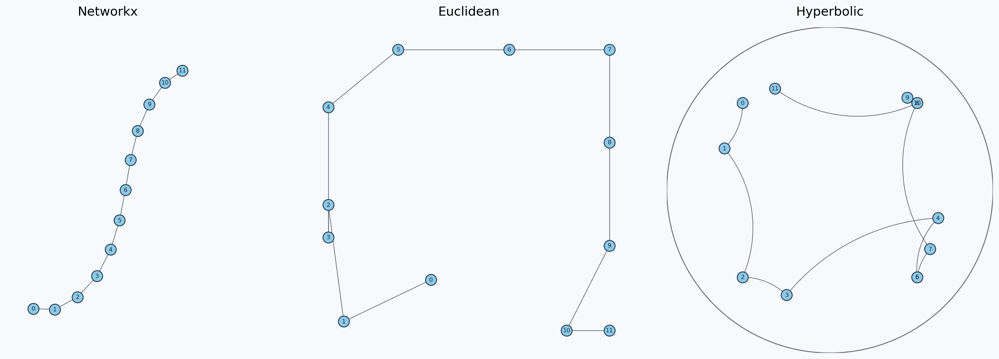

baseTreeStar


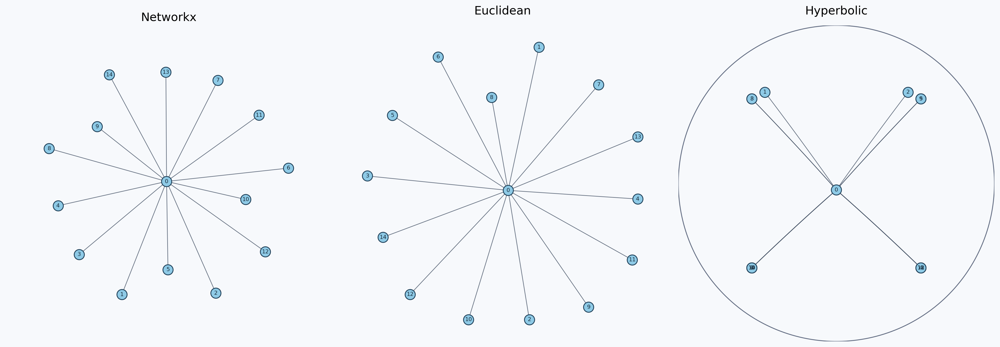

baseTreeBinary


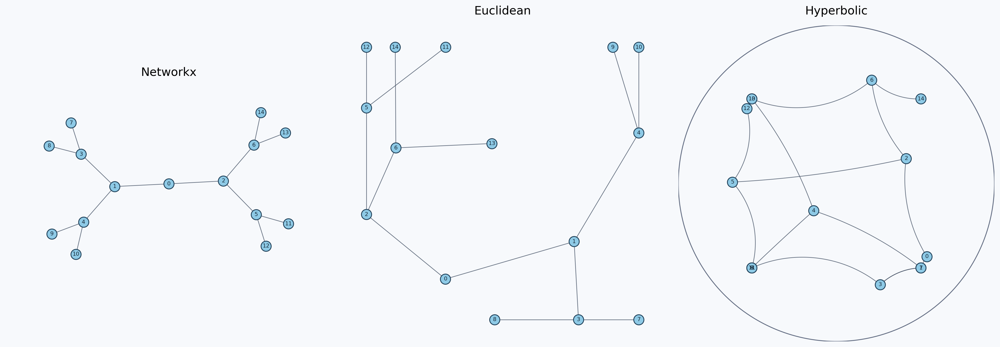

baseBipartiteComplete


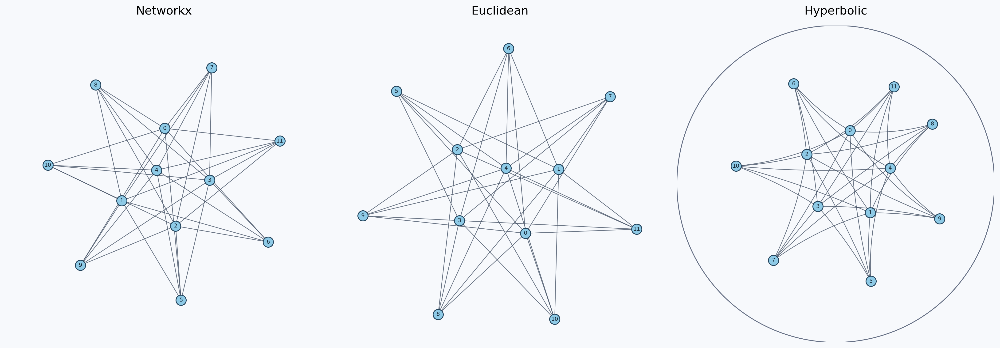

baseBipartiteLadder


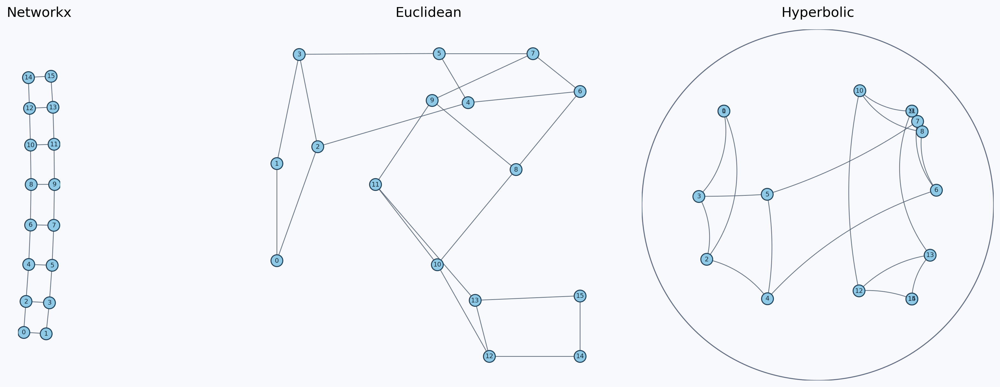

basePlanarWheel


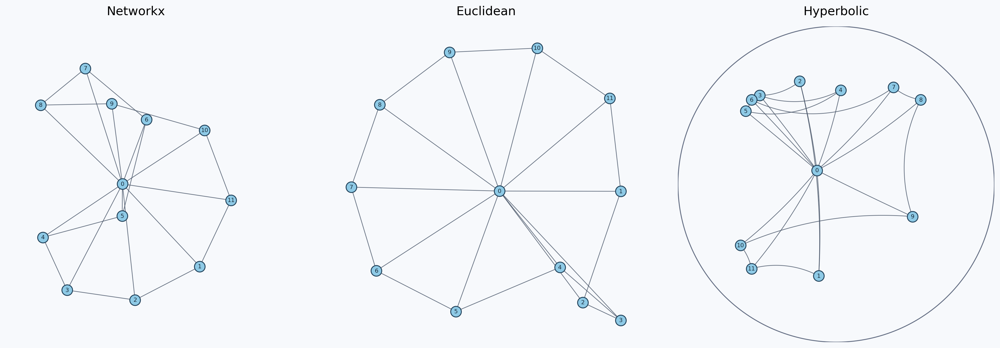

basePlanarTriangulated


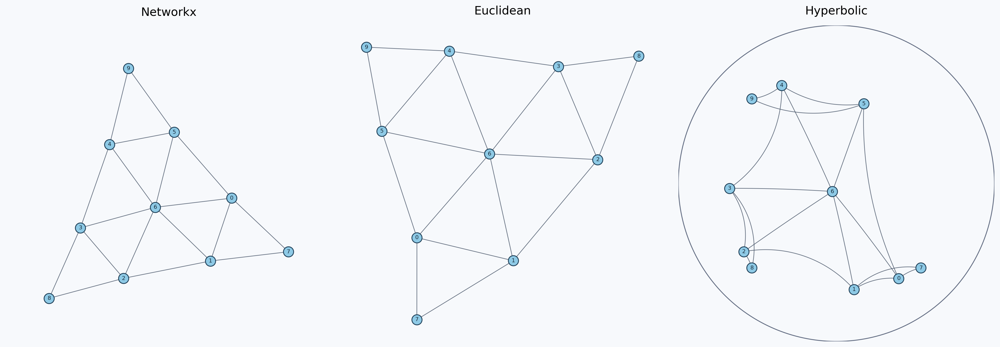

baseDisconnected


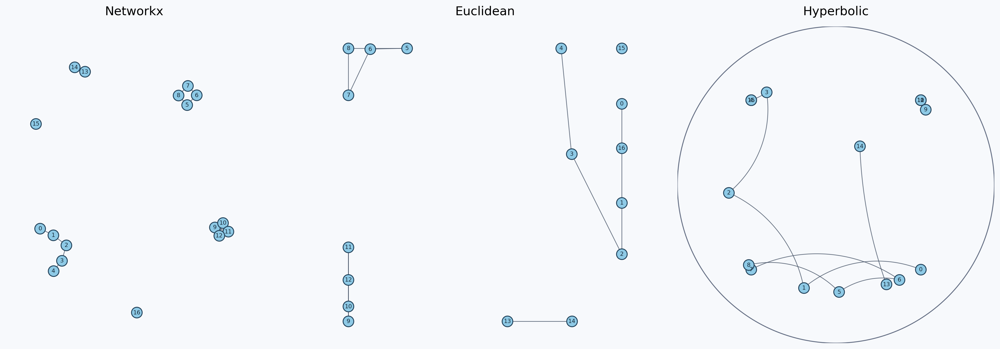

baseComplete


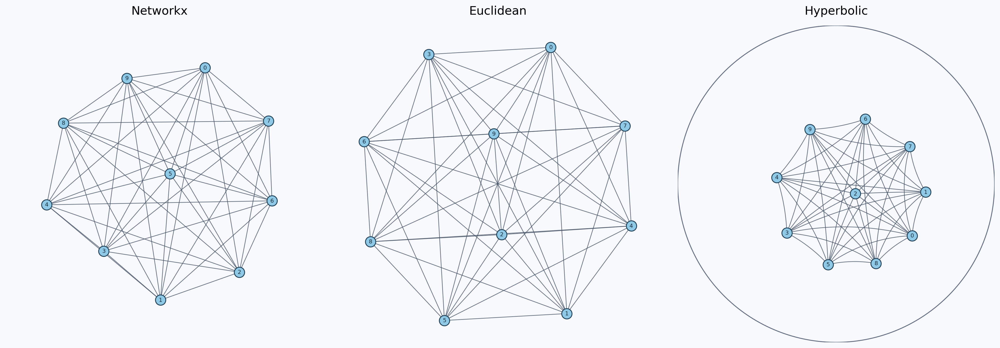

baseCommunity


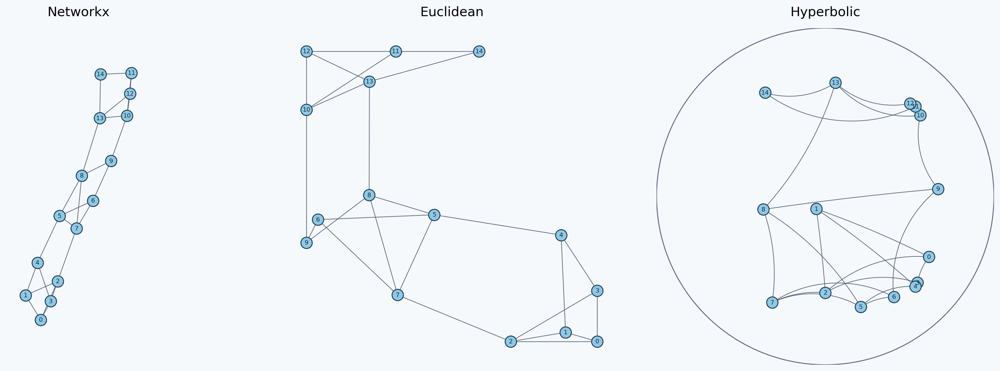

In [21]:
def flagsForGraph(flags, graphName, suffix):
	cur = list(flags)
	cur[cur.index("--graph") + 1] = graphName
	# cur[cur.index("--output") + 1] = f"out/notebook/far/compareNx/{graphName}{suffix}.json"
	return cur


def graphAndPosFromResult(res):
	data = res["json"]
	g = nx.Graph()
	pos = {}
	for node in data["nodes"]:
		nodeId = node["id"]
		g.add_node(nodeId)
		pos[nodeId] = (node["x"], node["y"])
	g.add_edges_from(tuple(e) for e in data["edges"])
	return g, pos


def drawGraph(ax, graph, pos, title, figSize=None, drawingSpace=None, limitPad=0.0):
	ax.set_facecolor("#f7f9fc")
	nx.draw_networkx_nodes(
		G=graph,
		pos=pos,
		ax=ax,
		node_color="#8ecae6",
		edgecolors="#24445c",
		linewidths=1.1,
		node_size=170,
	)
	if drawingSpace == "poincare":
		radius = min(figSize) / 2.0
		boundary = plt.Circle((0.0, 0.0), radius, fill=False, color="#667085", linewidth=1.1)
		ax.add_patch(boundary)
		for u, v in graph.edges():
			xs, ys = poincare_geodesic(pos[u], pos[v], radius)
			ax.plot(xs, ys, color="#475467", linewidth=0.85, alpha=0.8, zorder=1)
	else:
		nx.draw_networkx_edges(
			G=graph,
			pos=pos,
			ax=ax,
			width=0.85,
			edge_color="#475467",
			alpha=0.8,
		)
	nx.draw_networkx_labels(
		G=graph,
		pos=pos,
		ax=ax,
		labels={v: str(v) for v in graph.nodes()},
		font_size=7,
		font_color="#172b3a",
	)
	ax.set_title(title, fontsize=15, pad=14)
	ax.set_aspect("equal", adjustable="box")
	if figSize is not None:
		padX = figSize[0] * limitPad
		padY = figSize[1] * limitPad
		ax.set_xlim(-figSize[0] / 2.0 - padX, figSize[0] / 2.0 + padX)
		ax.set_ylim(-figSize[1] / 2.0 - padY, figSize[1] / 2.0 + padY)
	else:
		ax.margins(0.12)
	ax.axis("off")


for g in graphs:
	curG = nx.Graph()
	curG.add_nodes_from(g.nodes)
	curG.add_edges_from(g.edges)
	res = nx.spring_layout(G=curG, method="force", seed=1543)

	resEu = runGd(flagsForGraph(flagsEu, g.name, "Eu"), repo=mainPath, algoFlags=algoFlags, borderFlags=borderFlags)
	resHy = runGd(flagsForGraph(flagsHy, g.name, "Hy"), repo=mainPath, algoFlags=algoFlags, borderFlags=borderFlags)

	graphEu, posEu = graphAndPosFromResult(resEu)
	graphHy, posHy = graphAndPosFromResult(resHy)

	print(g.name)
	fig, axes = plt.subplots(1, 3, figsize=(18, 6))
	fig.patch.set_facecolor("#f7f9fc")
	drawGraph(axes[0], curG, res, "Networkx")
	drawGraph(axes[1], graphEu, posEu, "Euclidean", figSize=resEu["json"]["fig_size"], limitPad=0.08)
	drawGraph(axes[2], graphHy, posHy, "Hyperbolic", figSize=resHy["json"]["fig_size"], drawingSpace="poincare")
	fig.tight_layout(pad=0.8)
	plt.show()


Данные тесты показывают, что даже на самых базовых примерах моя реализация работает очень плохо. Надо искать причины данной проблемы. Пока что я склоняюсь к initialPlacement.

## Замер на N лучших

In [23]:
def mainTest(weights, runCount):
    for g in graphs:
        curG = nx.Graph()
        curG.add_nodes_from(g.nodes)
        curG.add_edges_from(g.edges)
        res = nx.spring_layout(G=curG, method="force", seed=1543)

        bestEu, scoresEu, allRunsEu = bestOfN(
            mainPath,
            flagsForGraph(flagsEu, g.name, "Eu"),
            runCount,
            weights,
            algoFlags=algoFlags,
            borderFlags=borderFlags
        )
        bestHy, scoresHy, allRunsHy = bestOfN(
            mainPath,
            flagsForGraph(flagsHy, g.name, "Hy"),
            runCount,
            weights,
            algoFlags=algoFlags,
            borderFlags=borderFlags
        )

        graphEu, posEu = graphAndPosFromResult(bestEu)
        graphHy, posHy = graphAndPosFromResult(bestHy)

        print(g.name)
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        fig.patch.set_facecolor("#f7f9fc")
        drawGraph(axes[0], curG, res, "Networkx")
        drawGraph(axes[1], graphEu, posEu, "Euclidean", figSize=bestEu["json"]["fig_size"], limitPad=0.08)
        drawGraph(axes[2], graphHy, posHy, "Hyperbolic", figSize=bestHy["json"]["fig_size"], drawingSpace="poincare")
        fig.tight_layout(pad=0.8)
        plt.show()

bestOfN graphHy: 100%|██████████| 100/100 [00:01<00:00, 53.39run/s]


baseTreePath


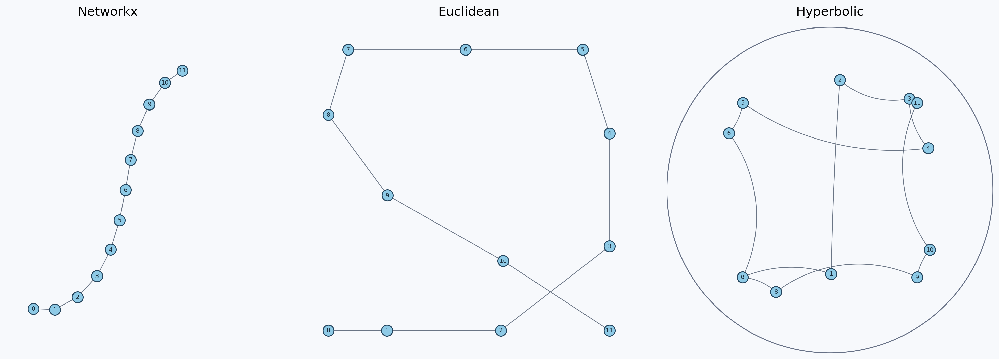

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 38.57run/s]


baseTreeStar


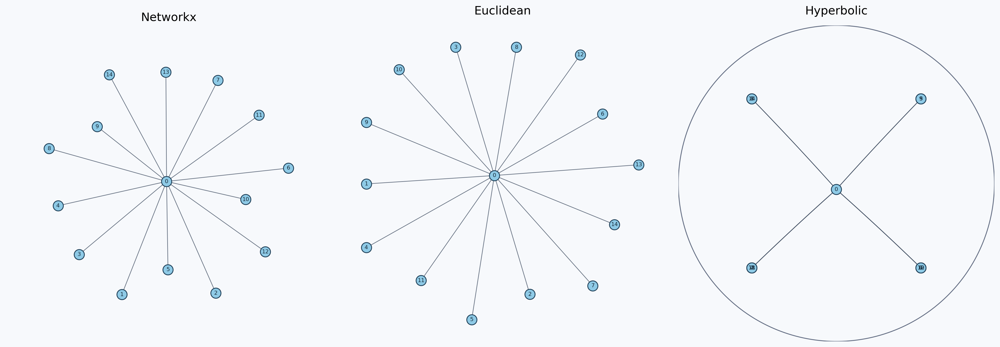

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 36.37run/s]


baseTreeBinary


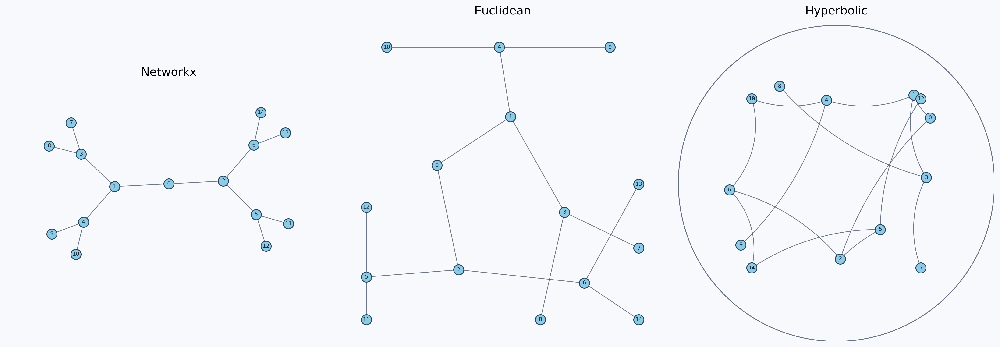

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 38.37run/s]


baseBipartiteComplete


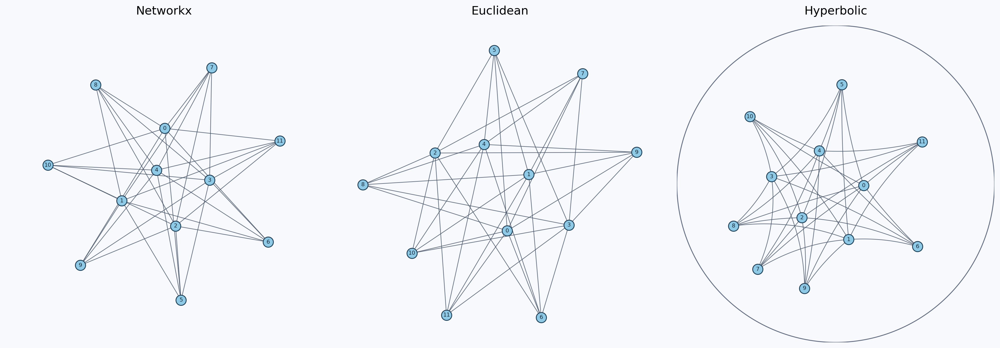

bestOfN graphHy: 100%|██████████| 100/100 [00:03<00:00, 32.11run/s]


baseBipartiteLadder


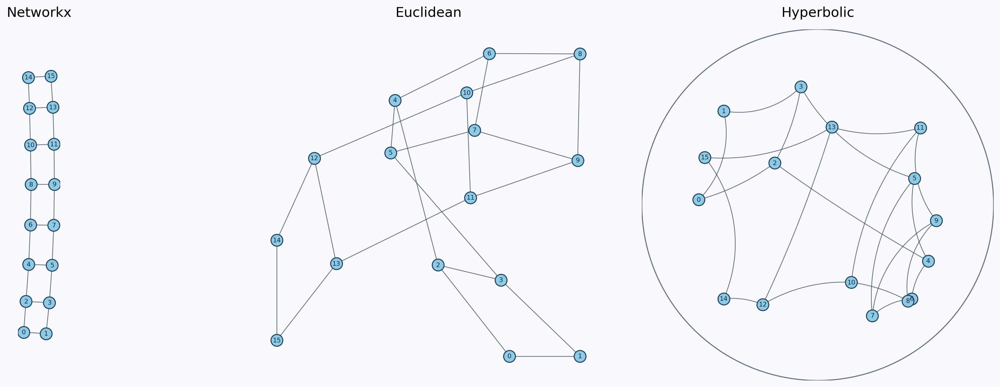

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 43.64run/s]


basePlanarWheel


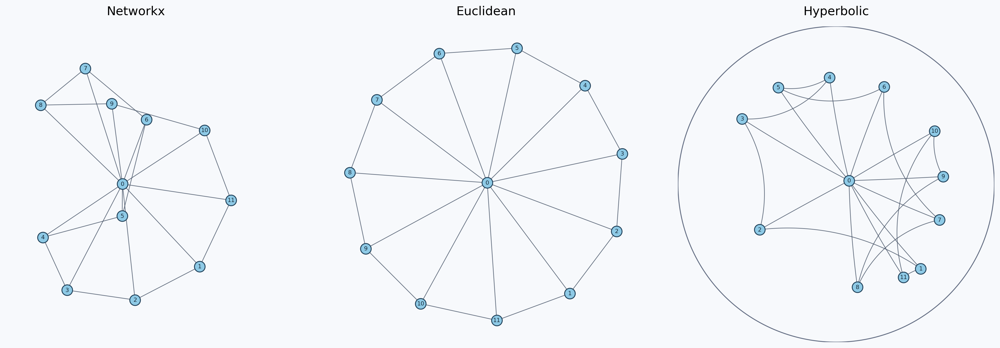

bestOfN graphHy: 100%|██████████| 100/100 [00:01<00:00, 54.92run/s]


basePlanarTriangulated


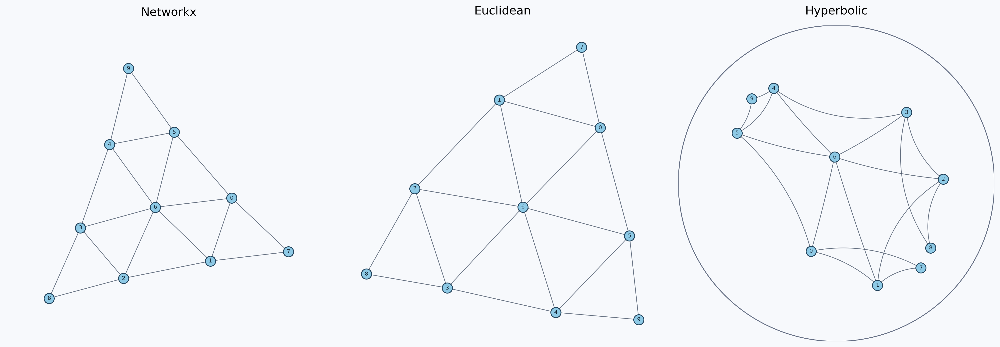

bestOfN graphHy: 100%|██████████| 100/100 [00:03<00:00, 31.06run/s]


baseDisconnected


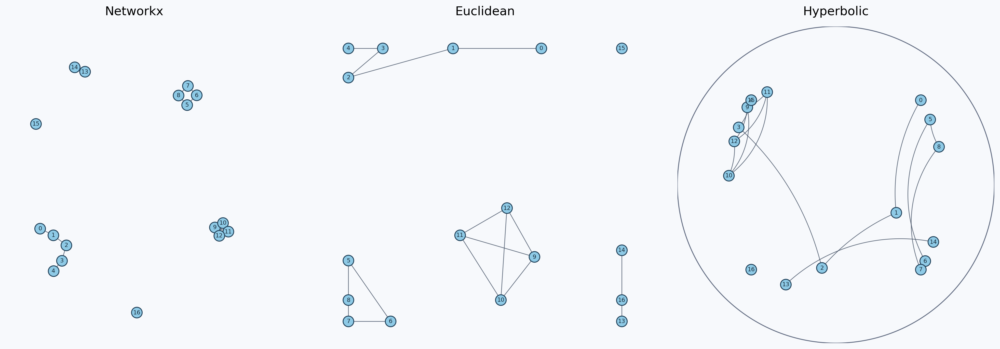

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 36.03run/s]


baseComplete


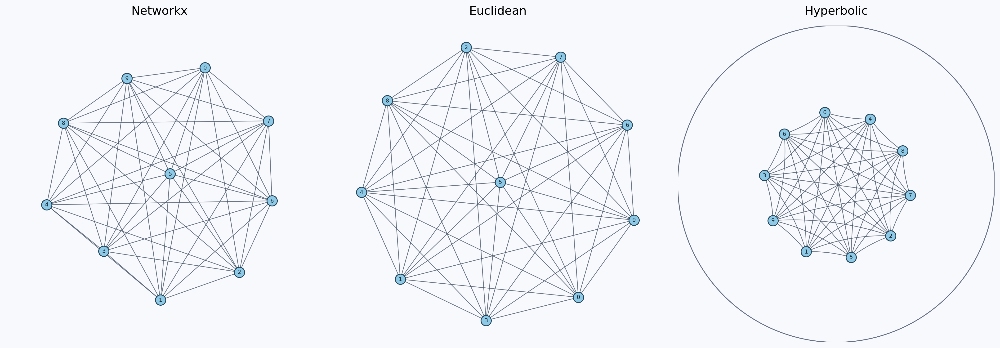

bestOfN graphHy: 100%|██████████| 100/100 [00:03<00:00, 31.35run/s]


baseCommunity


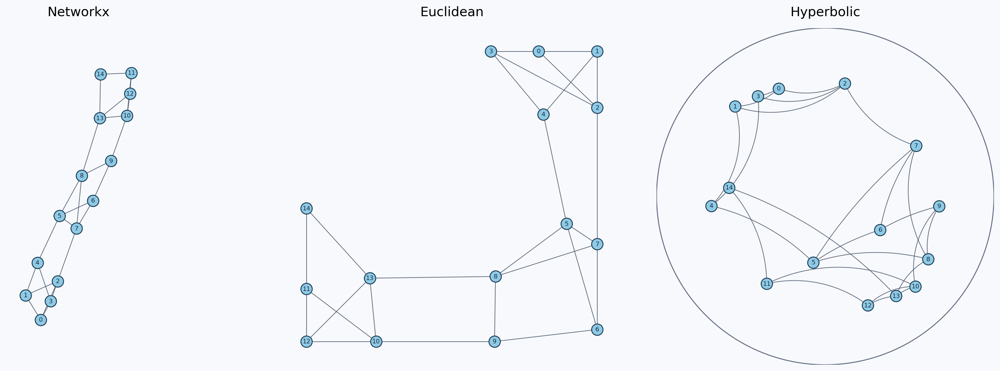

In [ ]:
weights = {
	"volume": 1.0,
	"minVertexDist": 1.2,
	"maxVertexDist": 1.0,
	"avgVertexDist": 1.0,
	"edgeCrossings": 2.0,
	"minAngle": 10.0,
	"maxAngle": 0.0,
	"density": 1.2,
	"imageScore": 0.0,
}

runCount = 100

mainTest(weights=weights, runCount=runCount)

На данном этапе уже видно, что при выделении весов метрикам можно достичь очень хороший результат, например на basePlanarWheel

bestOfN graphHy: 100%|██████████| 100/100 [00:01<00:00, 51.27run/s]


baseTreePath


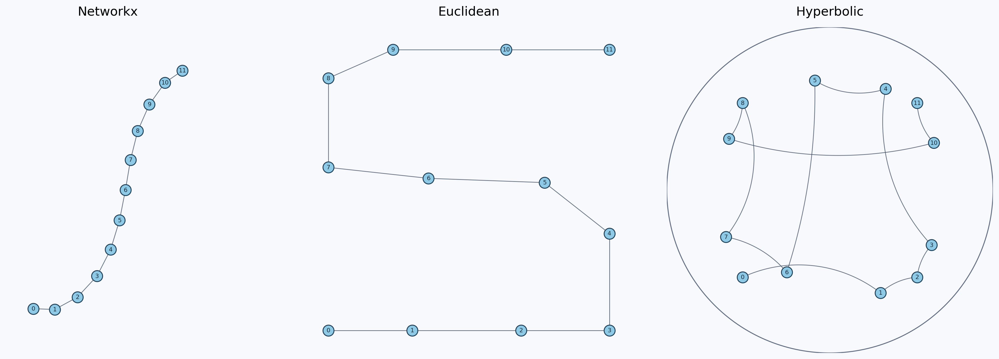

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 39.17run/s]


baseTreeStar


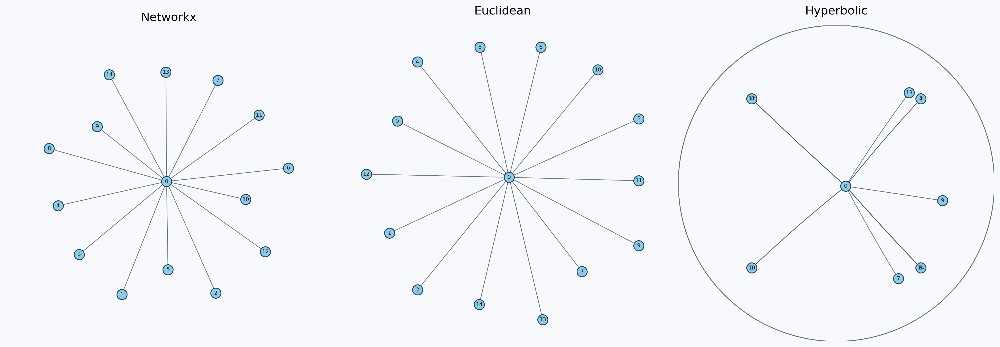

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 38.22run/s]


baseTreeBinary


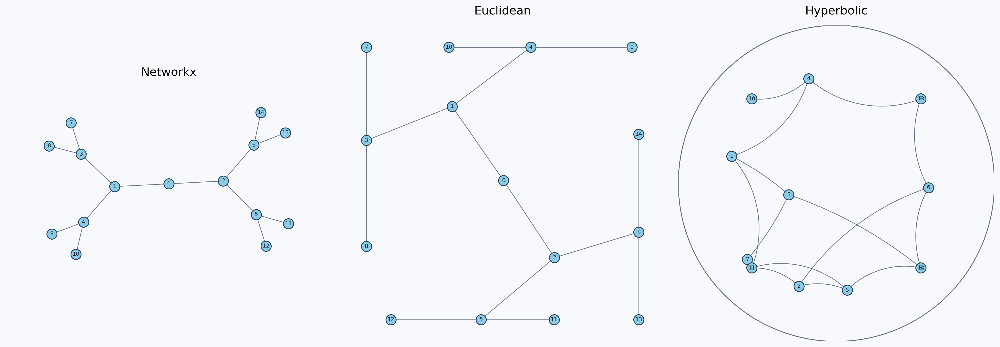

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 40.12run/s]


baseBipartiteComplete


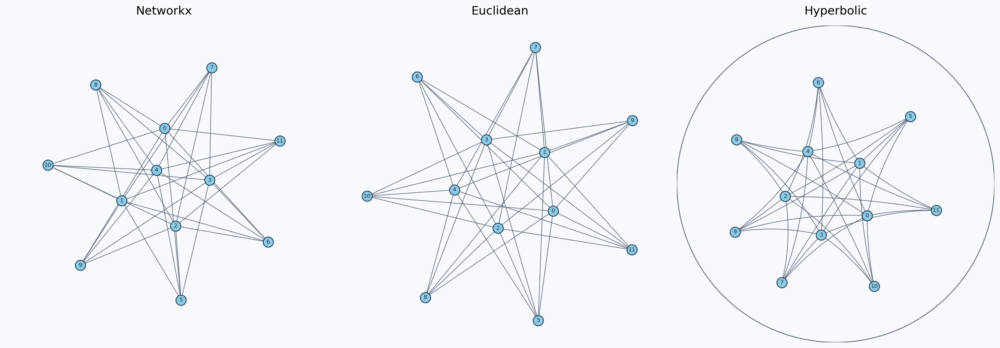

bestOfN graphHy: 100%|██████████| 100/100 [00:03<00:00, 33.16run/s]


baseBipartiteLadder


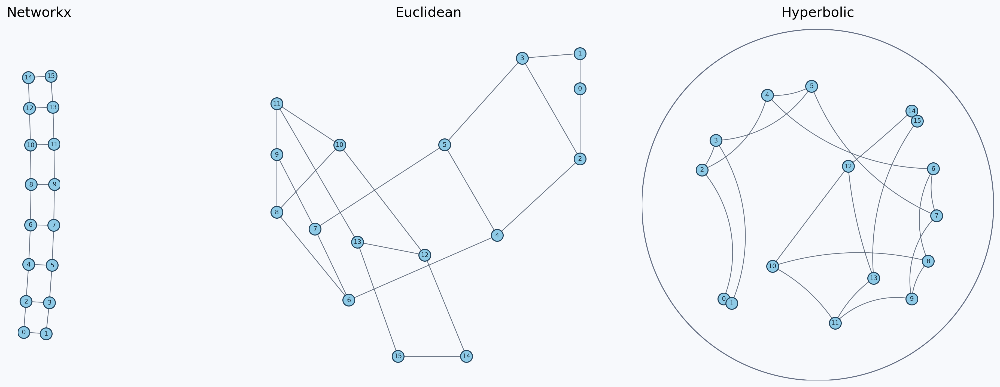

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 44.39run/s]


basePlanarWheel


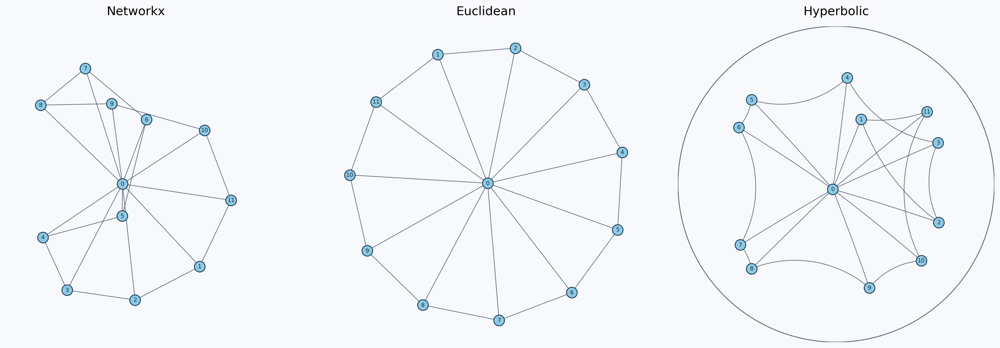

bestOfN graphHy: 100%|██████████| 100/100 [00:01<00:00, 53.88run/s]


basePlanarTriangulated


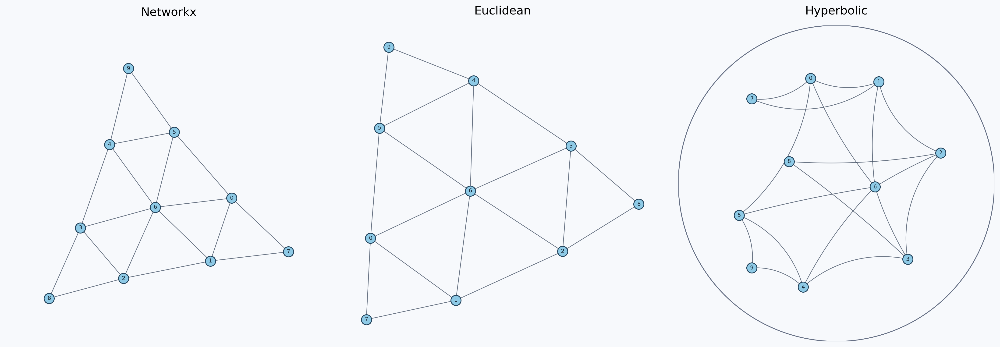

bestOfN graphHy: 100%|██████████| 100/100 [00:03<00:00, 32.20run/s]


baseDisconnected


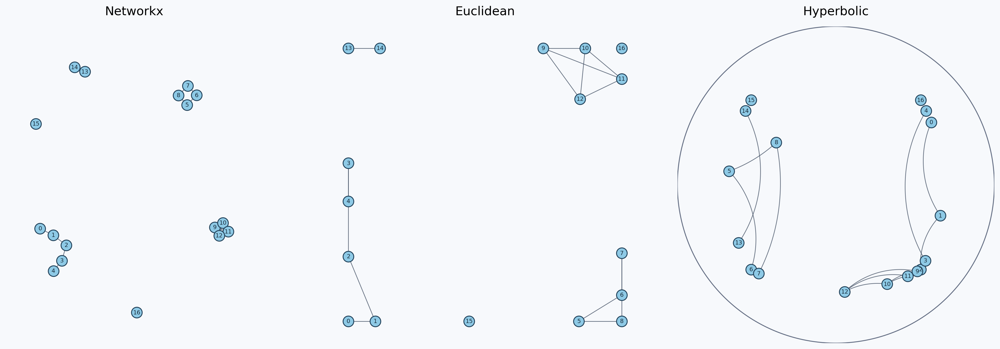

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 39.19run/s]


baseComplete


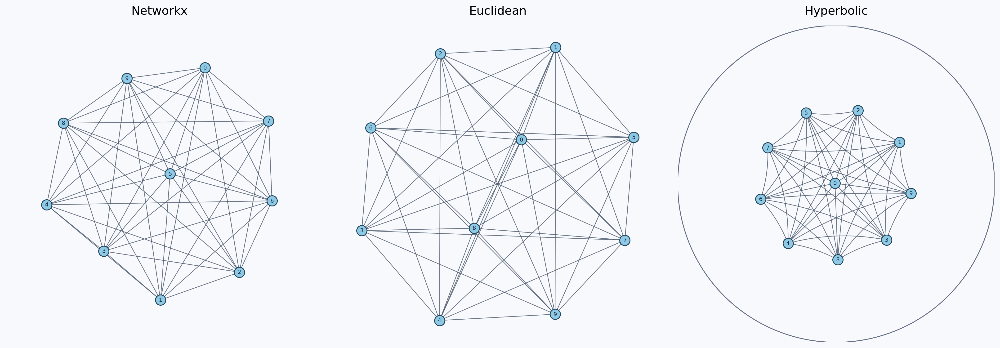

bestOfN graphHy: 100%|██████████| 100/100 [00:02<00:00, 34.45run/s]


baseCommunity


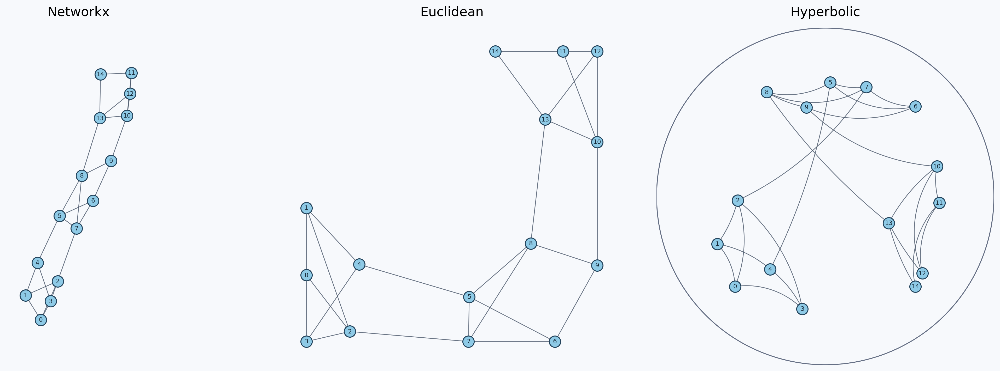

In [26]:
weights = {
	"volume": 1.0,
	"minVertexDist": 4.0,
	"maxVertexDist": -2.0,
	"avgVertexDist": 1.0,
	"edgeCrossings": -5.0,
	"minAngle": 3.0,
	"maxAngle": -1.0,
	"density": 0.0,
	"imageScore": 0.0,
}
# по факту смотрим на (maxVertex - minVertex) * 2

runCount = 100

mainTest(weights=weights, runCount=runCount)

Начало неплохое) Все кроме одного графа на мой взгляд получились лучше.